In [ ]:
!pip install ultralytics
!pip install Pillow



In [2]:
from ultralytics import YOLO
import torch
from google.colab import drive
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import shutil


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Drive

In [3]:
drive.mount('/content/drive')


Mounted at /content/drive


GPU


In [4]:
print(torch.cuda.is_available())


True


### Copie du dataset sur le content

In [5]:
!cp /content/drive/MyDrive/dataset/Fire_smoke_detectionyv8_plus.zip /content/Fire_smoke_detectionyv8_plus.zip


In [ ]:
!unzip /content/Fire_smoke_detectionyv8_plus.zip -d /content/


In [ ]:
local_dataset_path = '/content/Fire_smoke_detectionyv8_plus'
data_file_path = '/content/Fire_smoke_detectionyv8_plus/data.yaml'

### Anaylse des images

In [8]:
# Chemins vers les dossiers d'images
train_images_path = '/content/Fire_smoke_detectionyv8_plus/train/images'
train_labels_path = '/content/Fire_smoke_detectionyv8_plus/train/labels'
val_images_path = '/content/Fire_smoke_detectionyv8_plus/valid/images'

def get_image_sizes(image_folder):
    sizes = []
    for filename in os.listdir(image_folder):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp', '.tiff')):
            image_path = os.path.join(image_folder, filename)
            try:
                with Image.open(image_path) as img:
                    sizes.append(img.size)  # (largeur, hauteur)
            except Exception as e:
                print(f'Erreur lors de l\'ouverture de {filename}: {e}')
    return sizes


In [9]:
# Obtenir les tailles des images d'entraînement et de validation
train_sizes = get_image_sizes(train_images_path)
val_sizes = get_image_sizes(val_images_path)

# Combiner les tailles des deux ensembles
all_sizes = train_sizes + val_sizes


In [10]:
# Extraire les largeurs et hauteurs
widths = [size[0] for size in all_sizes]
heights = [size[1] for size in all_sizes]

# Calculer les statistiques
max_width = max(widths)
max_height = max(heights)
min_width = min(widths)
min_height = min(heights)
avg_width = sum(widths) / len(widths)
avg_height = sum(heights) / len(heights)

print(f'Largeur maximale : {max_width}')
print(f'Hauteur maximale : {max_height}')
print(f'Largeur minimale : {min_width}')
print(f'Hauteur minimale : {min_height}')
print(f'Largeur moyenne : {avg_width:.2f}')
print(f'Hauteur moyenne : {avg_height:.2f}')


Largeur maximale : 640
Hauteur maximale : 640
Largeur minimale : 640
Hauteur minimale : 480
Largeur moyenne : 640.00
Hauteur moyenne : 600.67


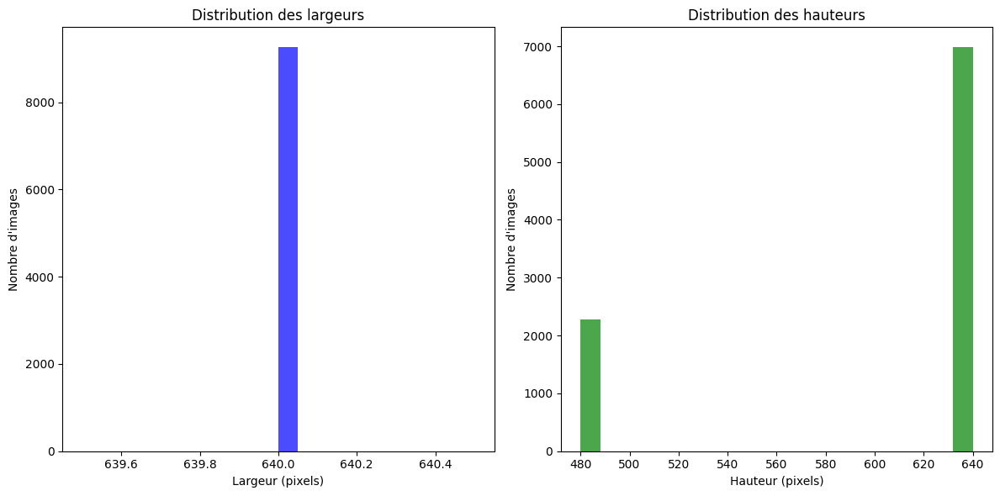

In [11]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))

# Histogramme des largeurs
plt.subplot(1, 2, 1)
plt.hist(widths, bins=20, color='blue', alpha=0.7)
plt.title('Distribution des largeurs')
plt.xlabel('Largeur (pixels)')
plt.ylabel('Nombre d\'images')

# Histogramme des hauteurs
plt.subplot(1, 2, 2)
plt.hist(heights, bins=20, color='green', alpha=0.7)
plt.title('Distribution des hauteurs')
plt.xlabel('Hauteur (pixels)')
plt.ylabel('Nombre d\'images')

plt.tight_layout()
plt.show()


Annotation

In [12]:
def display_image_with_boxes(images_path, annotation_path, class_names):
    for filename in os.listdir(images_path)[:5]:

      image_path = os.path.join(images_path, filename)
      annotation = os.path.join(annotation_path, filename.replace('.jpg', '.txt'))
      print(image_path)
      image = cv2.imread(image_path)
      height, width, _ = image.shape

      with open(annotation, 'r') as f:
          lines = f.readlines()


      for line in lines:
          class_id, x_center, y_center, w, h = map(float, line.strip().split())
          x_center *= width
          y_center *= height
          w *= width
          h *= height

          x1 = int(x_center - w / 2)
          y1 = int(y_center - h / 2)
          x2 = int(x_center + w / 2)
          y2 = int(y_center + h / 2)

          label = class_names[int(class_id)]
          cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
          cv2.putText(image, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX,
                      0.9, (36,255,12), 2)

      plt.figure(figsize=(10, 10))
      plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
      plt.axis('off')
      plt.show()


/content/Fire_smoke_detectionyv8_plus/train/images/frame_0758_jpg.rf.c626b0de6cc51fe920316f359cc91caf.jpg


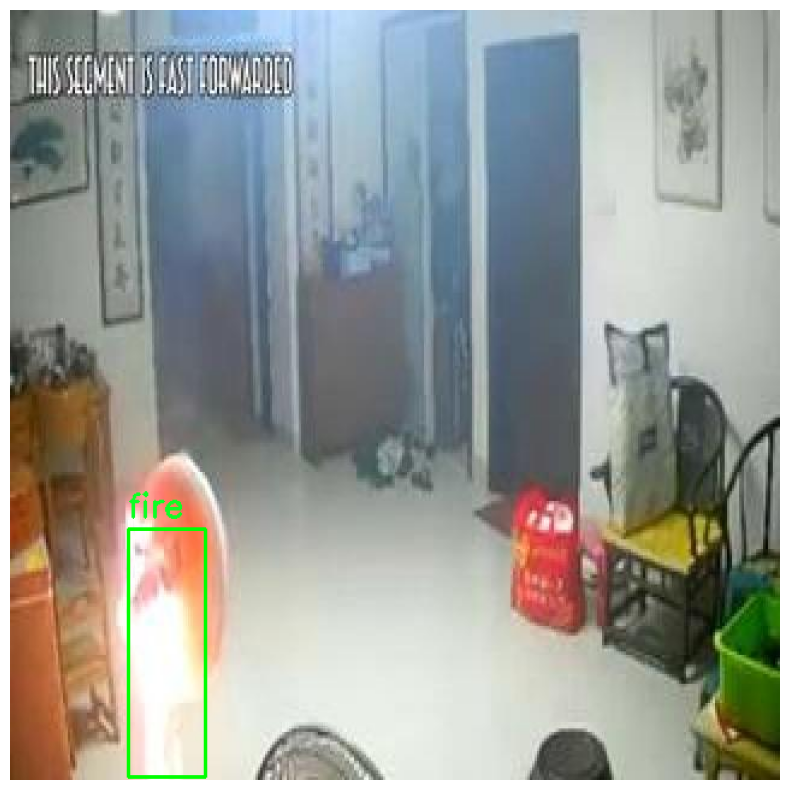

/content/Fire_smoke_detectionyv8_plus/train/images/ck0m1m206hgy907944qxlvo5i_jpeg_jpg.rf.6d3b7d4b83909ae8baeee2a755673de0.jpg


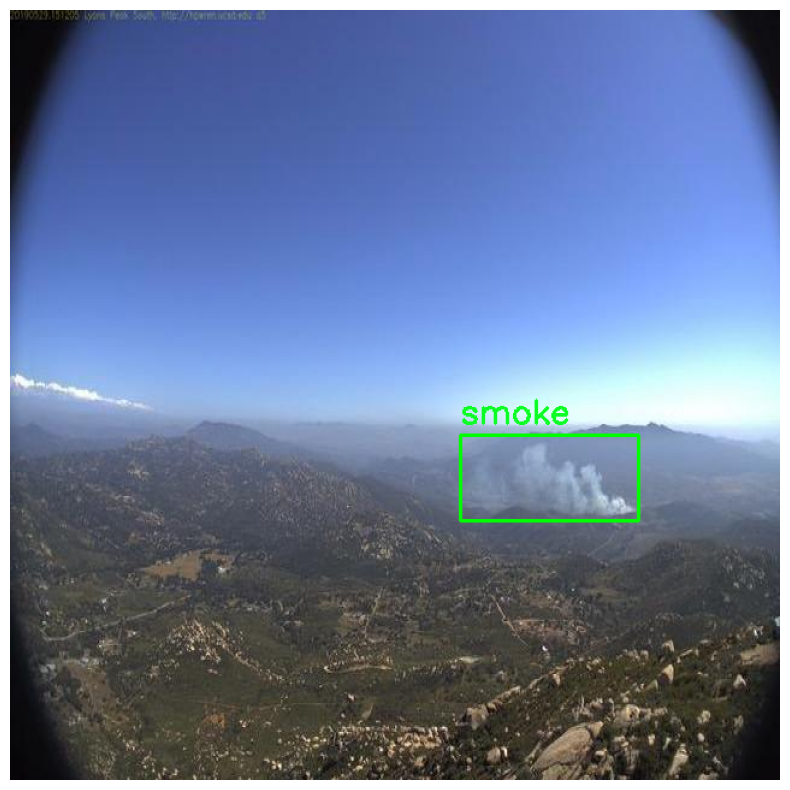

/content/Fire_smoke_detectionyv8_plus/train/images/0073_JPG_jpg.rf.8ed4abc825bdd3a7592414aa26118b85.jpg


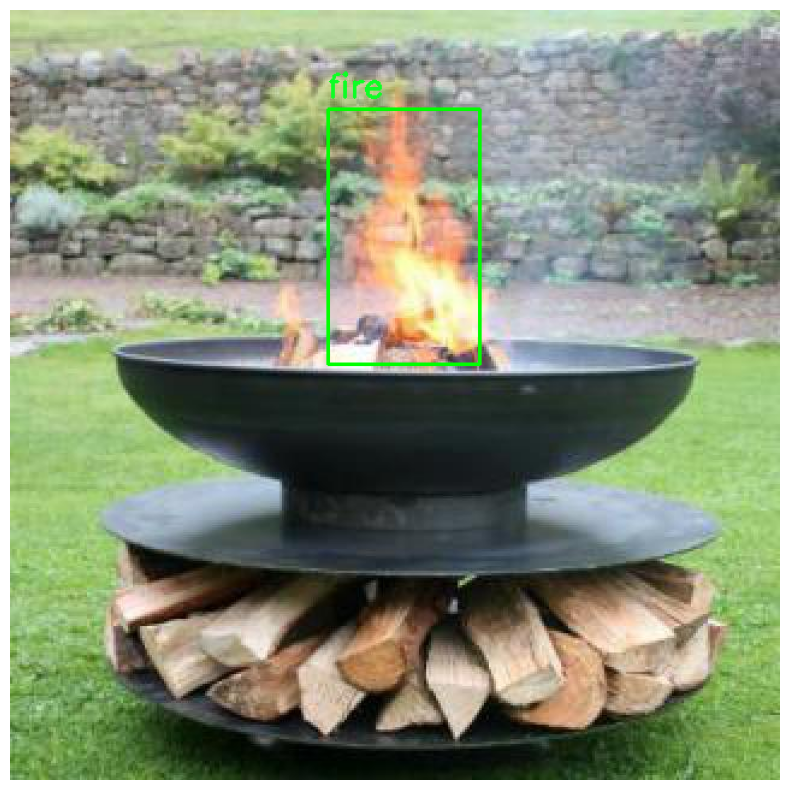

/content/Fire_smoke_detectionyv8_plus/train/images/large_-335-_jpg.rf.45cb29fdde249bcfea9cc5a1e41d9b71.jpg


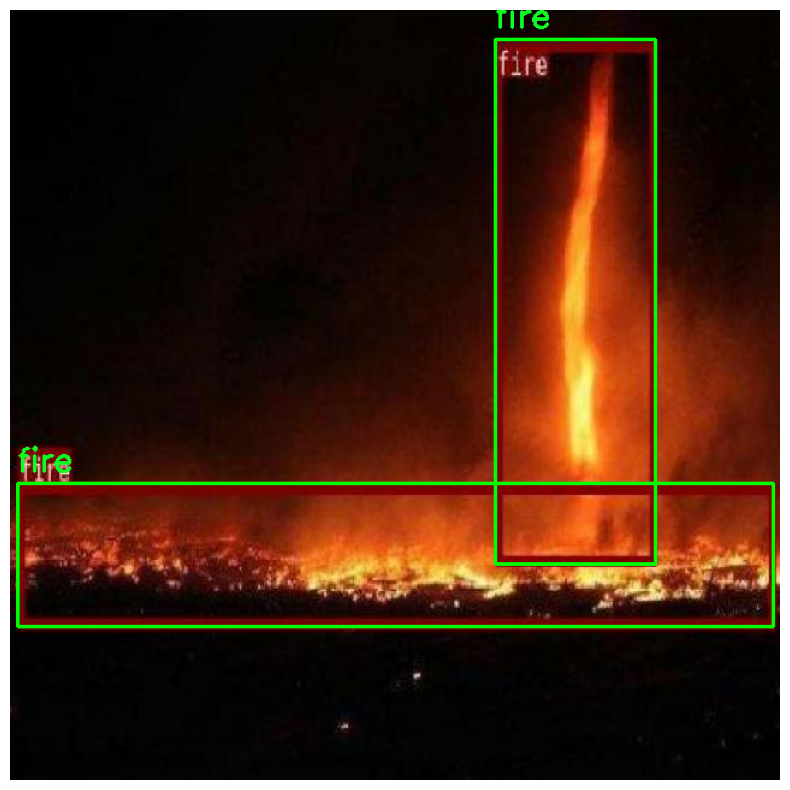

/content/Fire_smoke_detectionyv8_plus/train/images/48_jpg.rf.b1cc5351d2a57b8f5bc9eff4653afb48.jpg


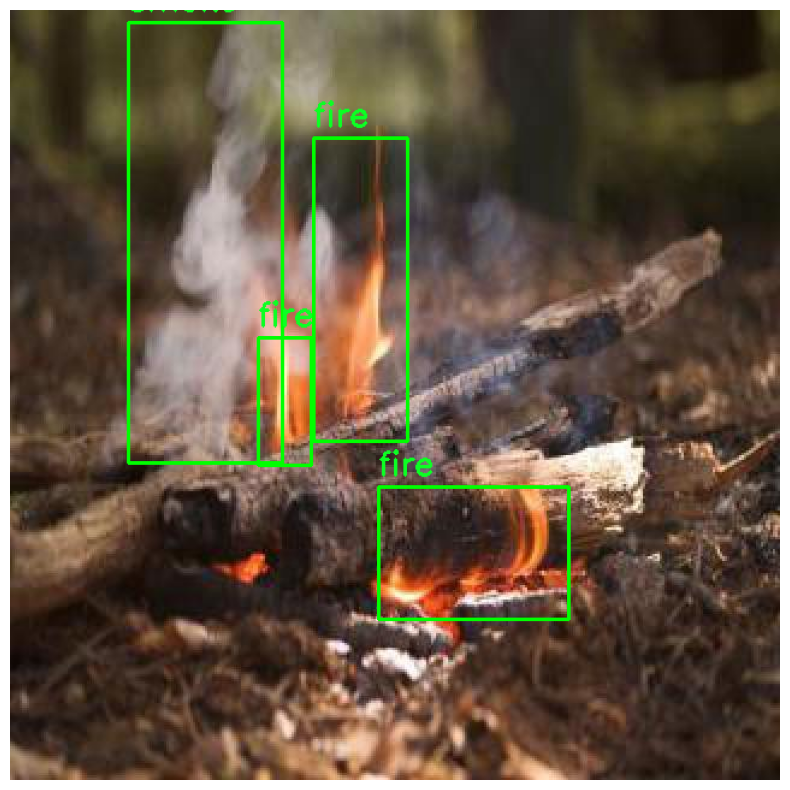

In [13]:
class_names = ['fire', 'smoke']
display_image_with_boxes(train_images_path, train_labels_path, class_names)


Distribution des classes

In [14]:
from collections import Counter
import glob
def get_class_distribution(annotation_dir, class_names):
    class_counts = Counter()
    for txt_file in glob.glob(os.path.join(annotation_dir, '*.txt')):
        with open(txt_file, 'r') as f:
            lines = f.readlines()
        for line in lines:
            class_id = int(line.strip().split()[0])
            class_counts[class_names[class_id]] += 1
    return class_counts




Images en doubles

In [15]:
!pip install imagehash pillow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 107.8 MB/s eta 0:00:00


In [16]:
import os
import glob
from PIL import Image
import imagehash

def find_duplicate_images_by_phash(image_dir, hash_func=imagehash.phash, hash_size=16):
    """
    Trouve les images en double dans un répertoire en utilisant le hachage perceptuel.

    :param image_dir: Chemin vers le dossier contenant les images
    :param hash_func: Fonction de hachage à utiliser (par défaut phash)
    :param hash_size: Taille du hachage (plus grande pour plus de précision)
    :return: Dictionnaire avec les hachages comme clés et les listes de fichiers correspondants comme valeurs
    """
    hashes = {}
    image_files = glob.glob(os.path.join(image_dir, '*.*'))

    for image_file in image_files:
        try:
            with Image.open(image_file) as img:
                # Calculer le hachage perceptuel de l'image
                img_hash = hash_func(img, hash_size=hash_size)
            # Convertir le hachage en chaîne de caractères pour l'utiliser comme clé
            hash_str = str(img_hash)

            if hash_str in hashes:
                hashes[hash_str].append(image_file)
            else:
                hashes[hash_str] = [image_file]
        except Exception as e:
            print(f"Erreur lors du traitement de {image_file}: {e}")

    # Filtrer les hachages qui ont plus d'un fichier associé (donc des doublons)
    duplicates = {hash_str: file_list for hash_str, file_list in hashes.items() if len(file_list) > 1}
    return duplicates

def delete_duplicate_images_by_phash(duplicates, annotation_dir=None):
    """
    Supprime les images en double et leurs annotations correspondantes.

    :param duplicates: Dictionnaire avec les hachages comme clés et les listes de fichiers correspondants comme valeurs
    :param annotation_dir: Chemin vers le dossier des annotations (optionnel)
    """
    for hash_str, file_list in duplicates.items():
        # Garder un fichier et supprimer les autres
        files_to_delete = file_list[1:]  # Conserver le premier fichier, supprimer les suivants
        for file_to_delete in files_to_delete:
            try:
                os.remove(file_to_delete)
                print(f"Image en double supprimée : {file_to_delete}")

                if annotation_dir:
                    base_name = os.path.basename(file_to_delete)
                    name, _ = os.path.splitext(base_name)
                    annotation_file = os.path.join(annotation_dir, f"{name}.txt")
                    if os.path.exists(annotation_file):
                        os.remove(annotation_file)
                        print(f"Annotation supprimée : {annotation_file}")
            except Exception as e:
                print(f"Erreur lors de la suppression de {file_to_delete}: {e}")




In [17]:

# Trouver les images en double
duplicates = find_duplicate_images_by_phash(train_images_path)

if duplicates:
    total_duplicates = sum(len(files) - 1 for files in duplicates.values())
    print(f"Nombre d'images en double trouvées : {total_duplicates}")
    for hash_str, file_list in duplicates.items():
        print(f"Doublons pour le hachage {hash_str}:")
        for file in file_list:
            print(f" - {file}")

    # Supprimer les images en double et leurs annotations
    delete_duplicate_images_by_phash(duplicates, annotation_dir=train_labels_path)
else:
    print("Aucun doublon d'image trouvé.")

Nombre d'images en double trouvées : 734
Doublons pour le hachage bc13d1c99660608c6a738e2de1b281ca781d96f3e1ec7833b7cc66978b61e59c:
 - /content/Fire_smoke_detectionyv8_plus/train/images/0073_JPG_jpg.rf.8ed4abc825bdd3a7592414aa26118b85.jpg
 - /content/Fire_smoke_detectionyv8_plus/train/images/0073_JPG_jpg.rf.c4e97e93b828a6ba1e735f8e0b044023.jpg
Doublons pour le hachage f864efac0079ccc667dd341067b8ec974cc4ee7e5cc667197080ccf750046cf3:
 - /content/Fire_smoke_detectionyv8_plus/train/images/large_-936-_jpg.rf.d16613612abf35e7789fdf76a666b025.jpg
 - /content/Fire_smoke_detectionyv8_plus/train/images/large_-936-_jpg.rf.922790c6c914fe15cc45e6d4f16ee4cd.jpg
Doublons pour le hachage c014b96800577f29d1d794290ff633a9c6fab90536ea4d95f22a8cd537295cd6:
 - /content/Fire_smoke_detectionyv8_plus/train/images/ckau2kdcuyf190753m6zrjztp_jpeg.rf.2b430e81e9afe3d3153eb37ddaaa6a67.jpg
 - /content/Fire_smoke_detectionyv8_plus/train/images/ckau2sxhxyiw90744izbgfkza_jpeg.rf.4464fd18efd9762becf3fe2f845b2cbf.jpg
 -

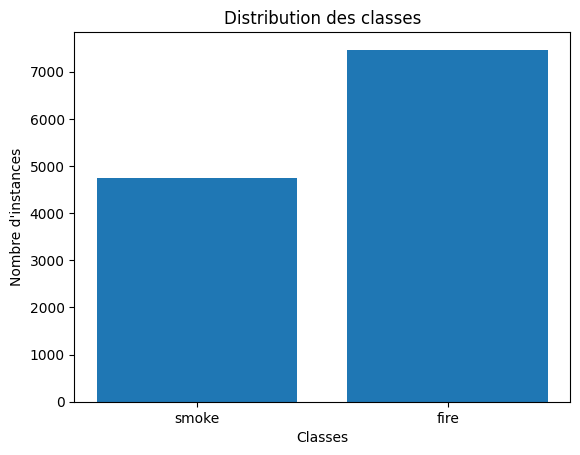

In [18]:
class_counts = get_class_distribution(train_labels_path, class_names)
plt.bar(class_counts.keys(), class_counts.values())
plt.title('Distribution des classes')
plt.xlabel('Classes')
plt.ylabel('Nombre d\'instances')
plt.show()

Images floues

In [19]:
def detect_blurry_images(image_dir, threshold=100.0):
    blurry_images = []
    for image_file in glob.glob(os.path.join(image_dir, '*.*')):
        image = cv2.imread(image_file, cv2.IMREAD_GRAYSCALE)
        if image is None:
            print(f"Impossible de lire l'image {image_file}")
            continue
        laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()
        if laplacian_var < threshold:
            blurry_images.append((image_file, laplacian_var))

    if blurry_images:
        print(len(blurry_images))
        for img, var in blurry_images[:2]:
          image = cv2.imread(img, cv2.IMREAD_GRAYSCALE)
          plt.figure(figsize=(10, 10))
          plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
          plt.axis('off')
          plt.show()

    else:
        print("Aucune image floue détectée.")



722


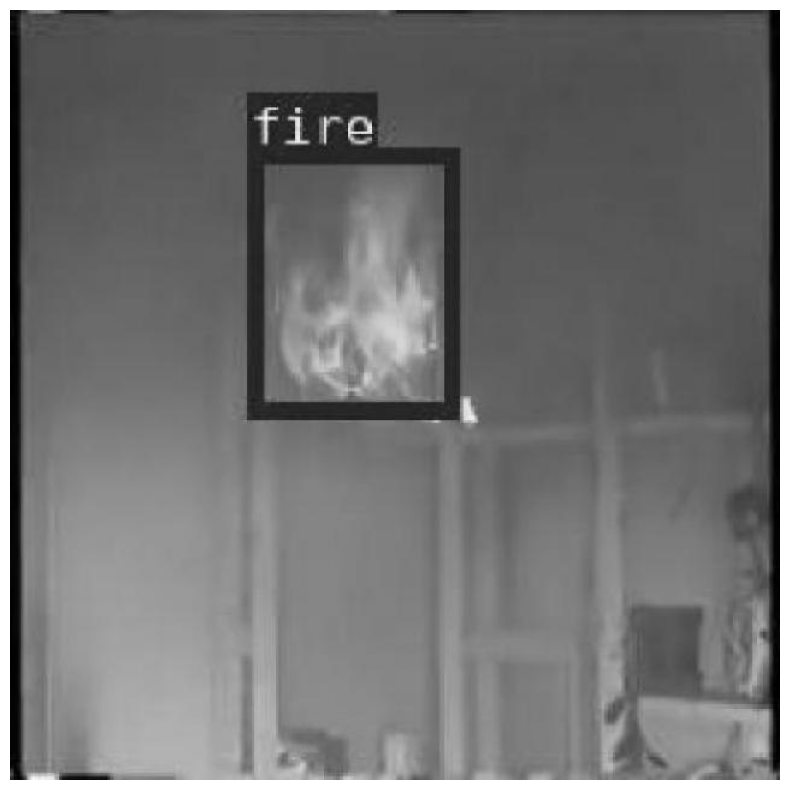

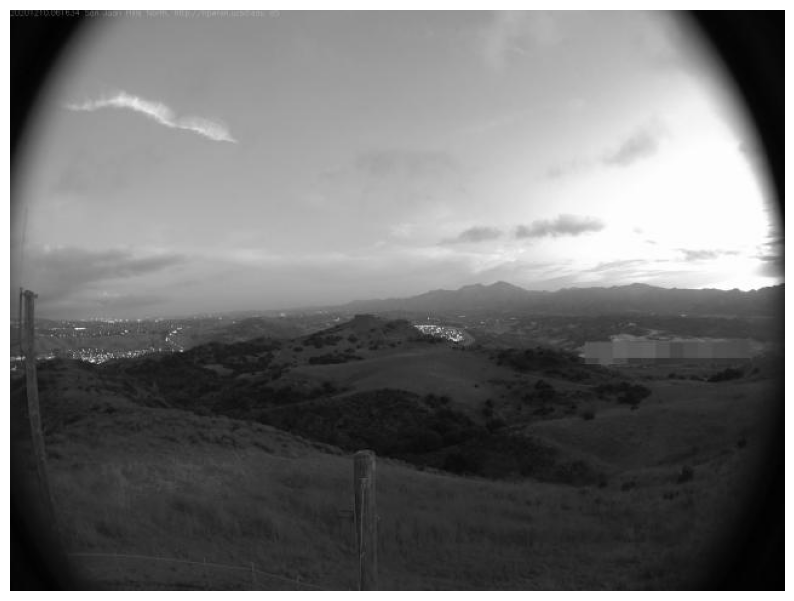

In [20]:
detect_blurry_images(train_images_path)

### MODEL

In [21]:
model_name = "yolov8n"
model = YOLO(f'{model_name}.pt')


100%|██████████| 6.25M/6.25M [00:00<00:00, 386MB/s]


### TRAIN

In [22]:
import datetime
date = datetime.datetime.now()
date_str = str(date)[:10]

In [23]:

epochs = 100
batch = 16
imgsz = 640
name = f"{model_name}_{epochs}_{batch}_{imgsz}_{date_str}_enhanced"
results_dir = '/content/runs/detect/train'


names:
  0: feu
  1: fumée
weights:
  feu: 1.0
  fumée: 1.5

In [ ]:
model.train(data=data_file_path,epochs= epochs,batch= batch, imgsz =imgsz,name =name,project =results_dir,weight_decay=0.01,lr0=0.001 ,optimizer='AdamW')


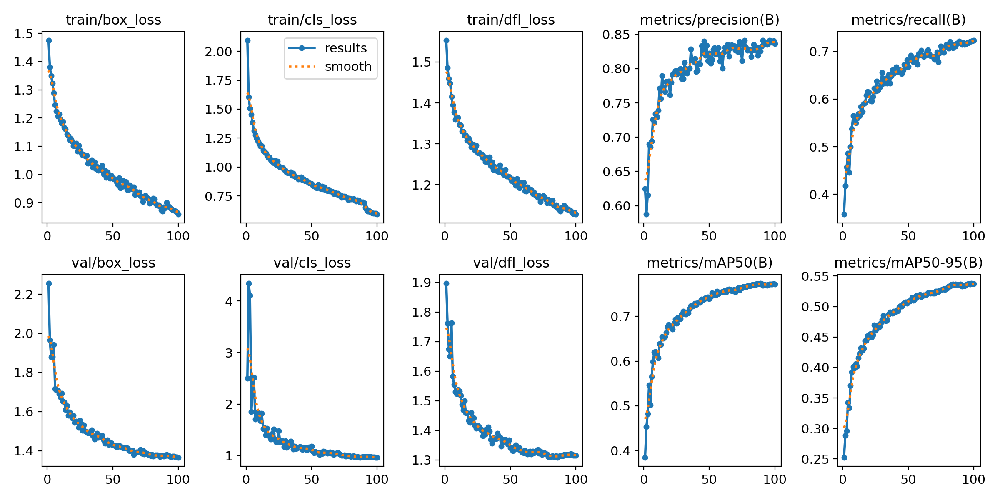

In [29]:
from IPython.display import Image

# Afficher le graphique des résultats
Image(filename=f'{results_dir}/{name}/results.png', width=800)


a. Perte d'entraînement et de validation
Perte décroissante : Une perte qui diminue de manière régulière indique que le modèle apprend.
Stagnation : Si la perte cesse de diminuer, le modèle peut avoir atteint sa convergence.
Surapprentissage (Overfitting) : Si la perte d'entraînement continue de diminuer tandis que la perte de validation stagne ou augmente, le modèle surapprend.

b. Précision et rappel
Augmentation : Une augmentation de la précision et du rappel sur l'ensemble de validation indique une amélioration des performances.
Stagnation ou diminution : Peut indiquer que le modèle n'apprend plus ou qu'il surapprend.

c. mAP50 et mAP50-95
mAP50 : Indique la précision du modèle à un seuil IoU de 0.5.
mAP50-95 : Moyenne de la précision sur des seuils IoU de 0.5 à 0.95.
Interprétation : Des valeurs élevées indiquent une bonne performance de détection.

In [30]:


destination = f'/content/drive/MyDrive/results_fire/{name}'

# Copier le dossier
shutil.copytree(results_dir, destination)


'/content/drive/MyDrive/results_fire/yolov8n_100_16_640_2024-09-25_enhanced'

## Test

### Test visuel sur dataset différent

In [33]:
# Chemin vers le modèle entraîné

model_path = f'/content/drive/MyDrive/results_fire/{name}/{name}/weights/best.pt'

# Charger le modèle
model = YOLO(model_path)


In [32]:
drive_test_images_path = '/content/drive/MyDrive/dataset/test_images'
test_images_path = '/content/test_images'

In [34]:

# Copier les images depuis Google Drive
shutil.copytree(drive_test_images_path, test_images_path)

'/content/test_images'

In [35]:
# Effectuer des prédictions

results = model.predict(source=test_images_path, save=True, save_txt=True)



image 1/10 /content/test_images/abc006.jpg: 640x640 2 fires, 7.4ms
image 2/10 /content/test_images/abc009 - Copie.jpg: 640x640 1 fire, 7.4ms
image 3/10 /content/test_images/abc023.jpg: 640x640 1 smoke, 7.3ms
image 4/10 /content/test_images/abc175.jpg: 640x640 4 fires, 7.3ms
image 5/10 /content/test_images/abc191.jpg: 640x640 1 fire, 8.5ms
image 6/10 /content/test_images/abc199.jpg: 640x640 (no detections), 7.4ms
image 7/10 /content/test_images/abc203.jpg: 640x640 (no detections), 7.4ms
image 8/10 /content/test_images/ck0k99e6p79go0944lmxivkmv_jpeg_jpg.rf.33ca99d495144b9e7ffad0a4a453d3b7.jpg: 640x640 1 smoke, 7.4ms
image 9/10 /content/test_images/ck0kepbs9kdym0848hgpcf3y9_jpeg_jpg.rf.7c35fa1410c250bca7d38dc4b6bdfc9e.jpg: 640x640 1 smoke, 7.4ms
image 10/10 /content/test_images/ck0kmfd7ibcib0721v08q1jv0_jpeg_jpg.rf.23b728dcffc3029baa5ad452d3b0f336.jpg: 640x640 1 smoke, 7.4ms
Speed: 2.0ms preprocess, 7.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to r

['abc203.jpg', 'abc006.jpg', 'abc175.jpg', 'abc191.jpg', 'ck0k99e6p79go0944lmxivkmv_jpeg_jpg.rf.33ca99d495144b9e7ffad0a4a453d3b7.jpg', 'abc023.jpg', 'ck0kmfd7ibcib0721v08q1jv0_jpeg_jpg.rf.23b728dcffc3029baa5ad452d3b0f336.jpg', 'abc199.jpg', 'ck0kepbs9kdym0848hgpcf3y9_jpeg_jpg.rf.7c35fa1410c250bca7d38dc4b6bdfc9e.jpg', 'abc009 - Copie.jpg']


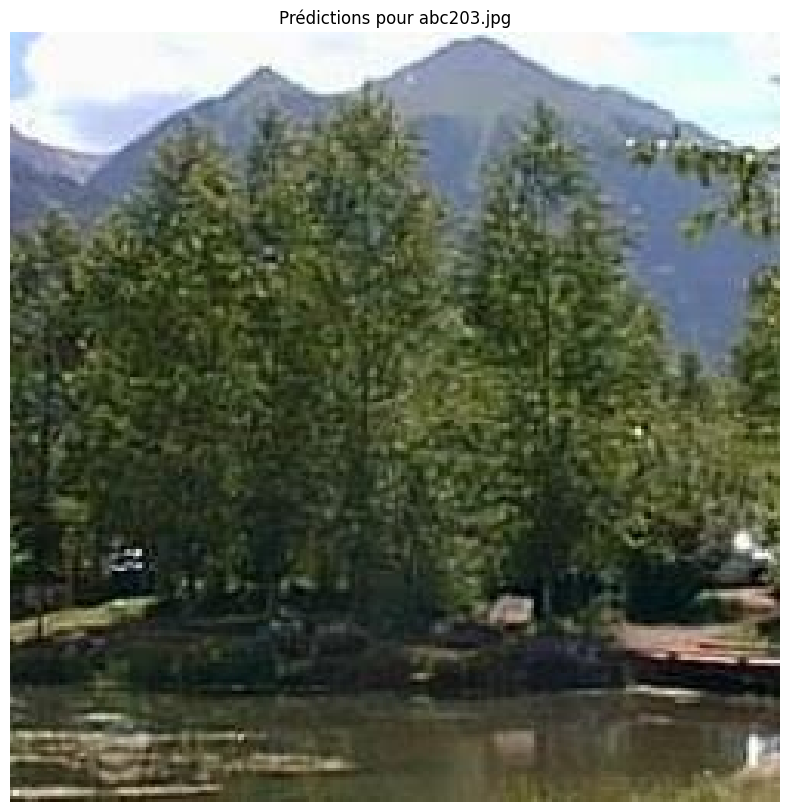

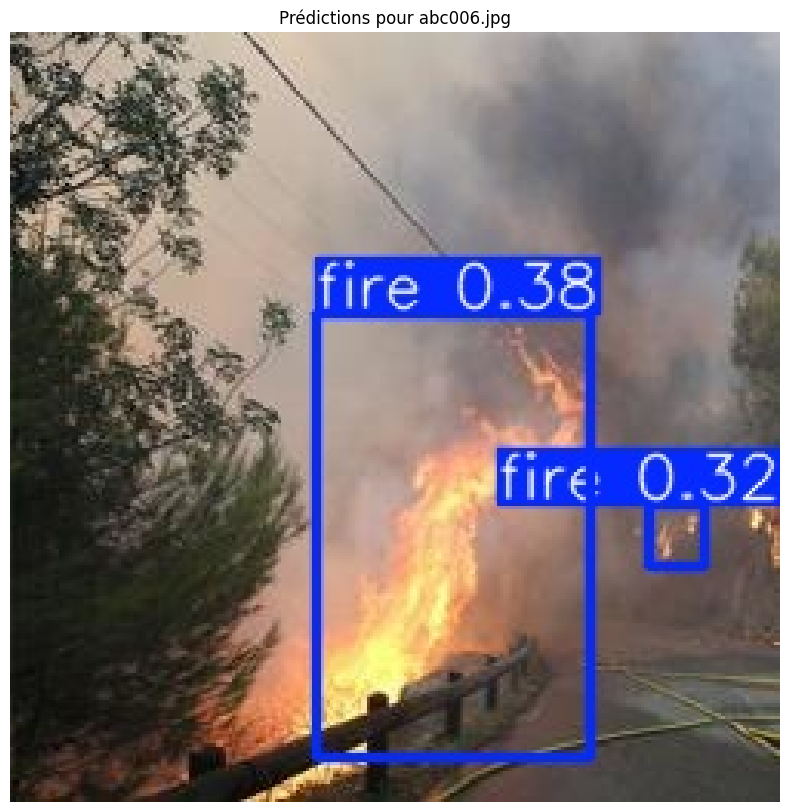

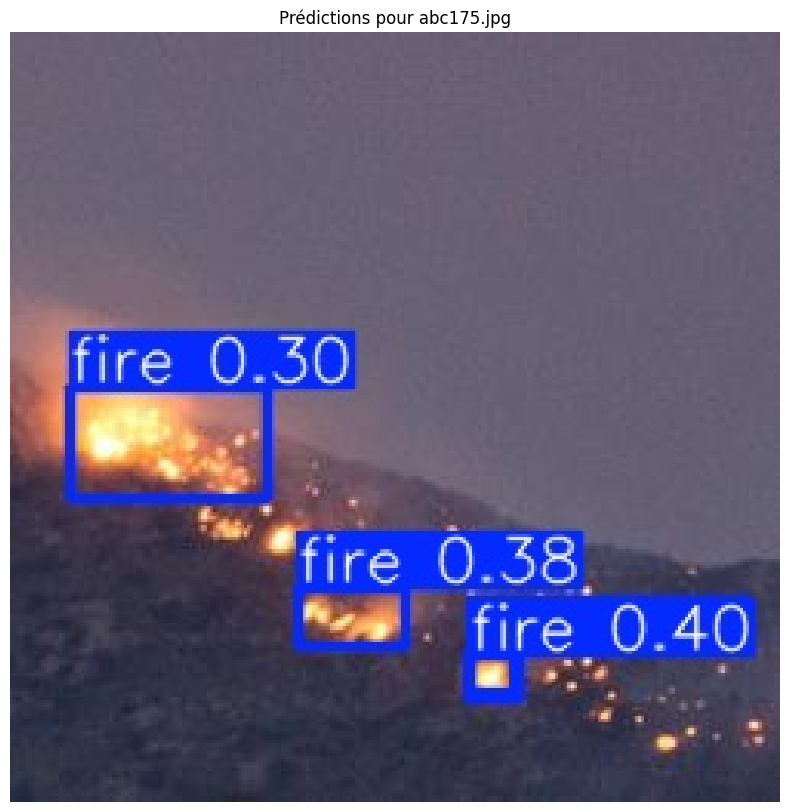

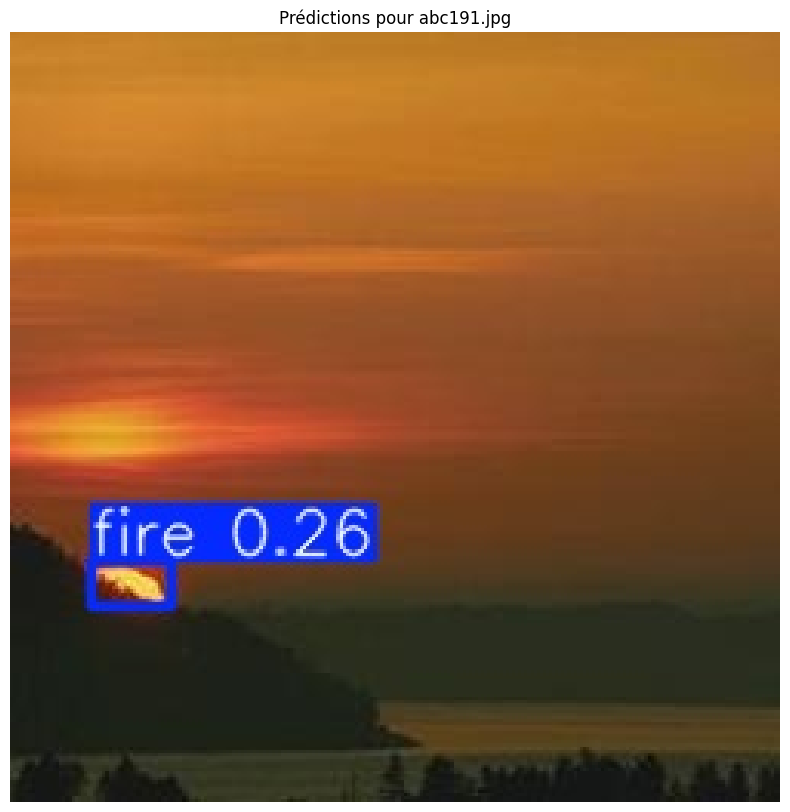

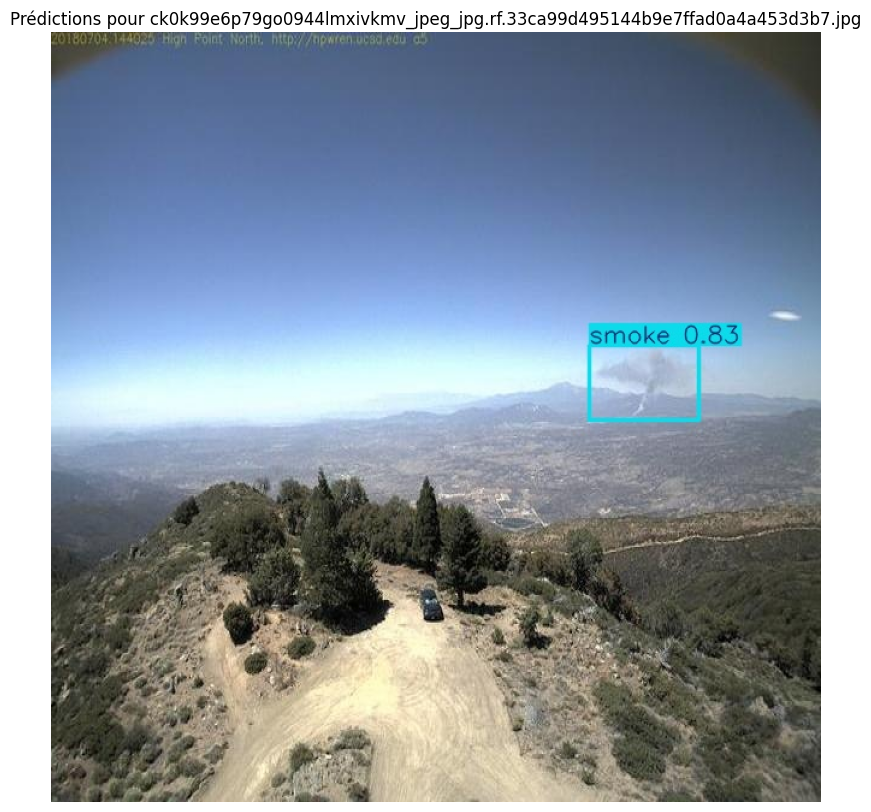

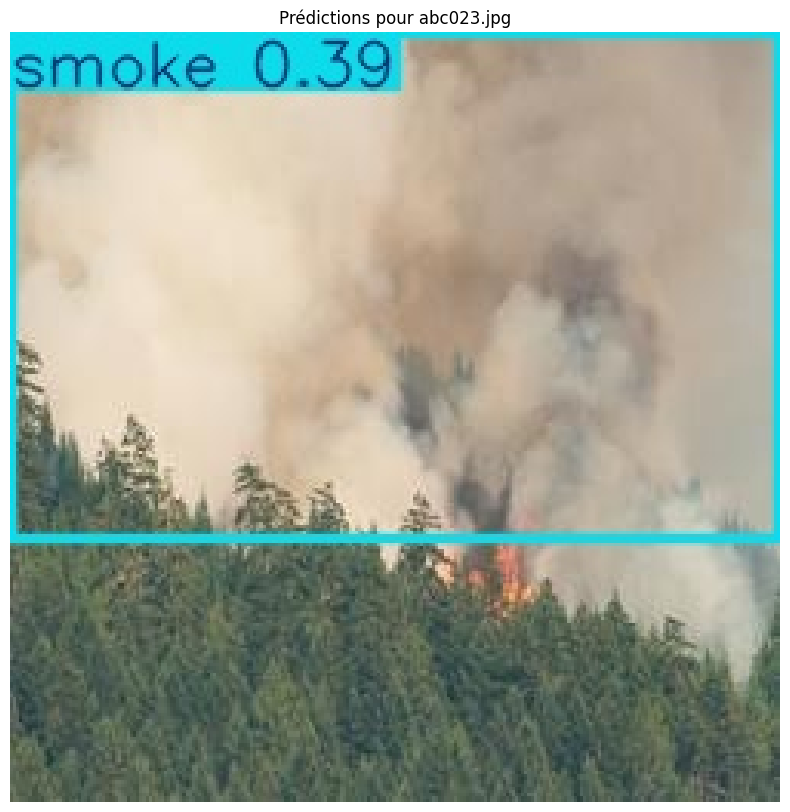

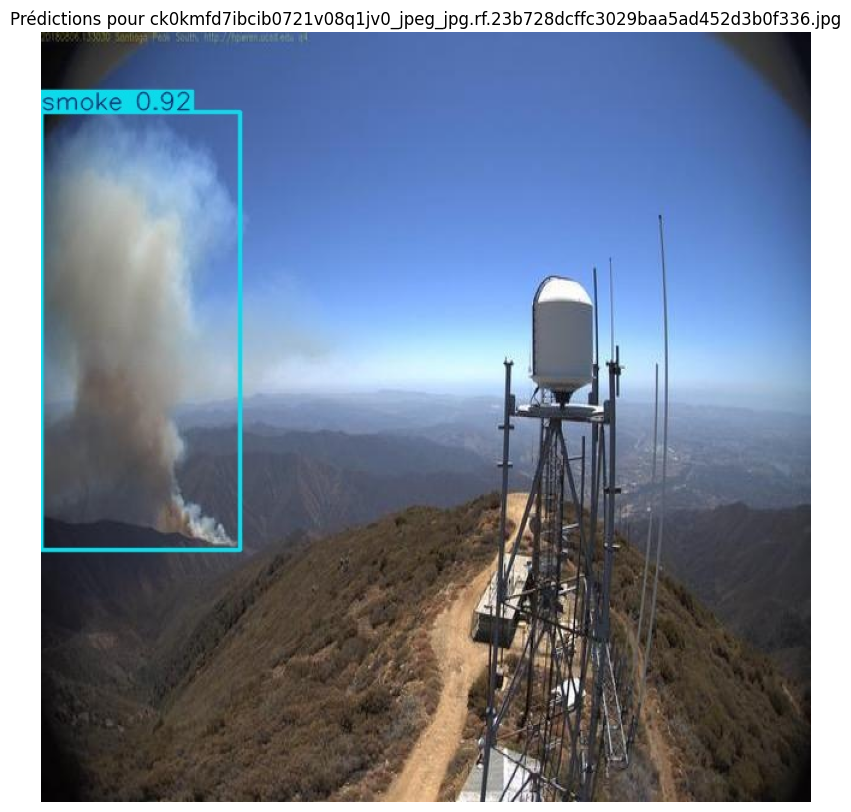

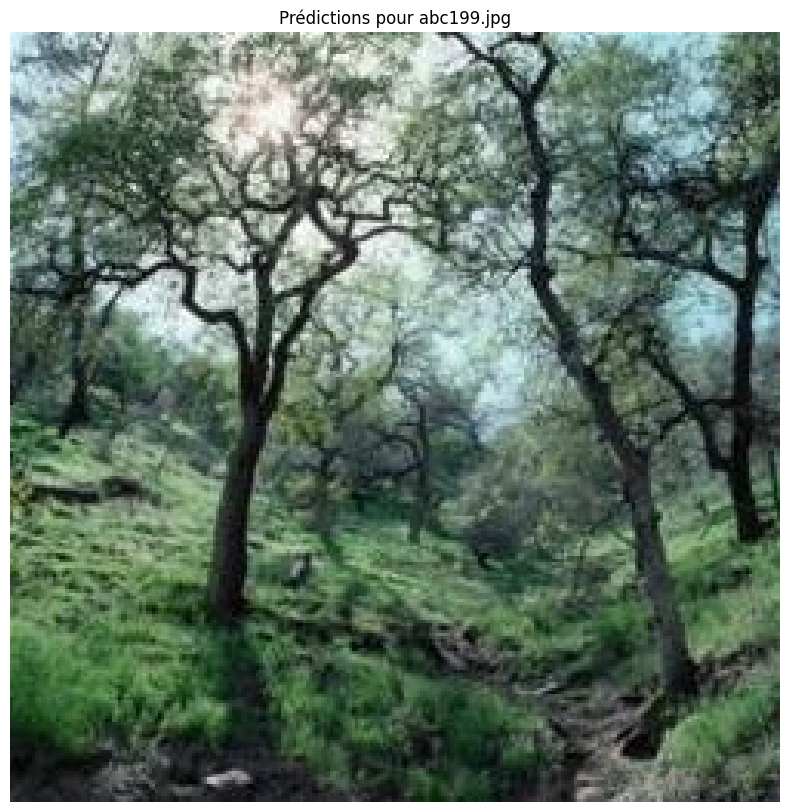

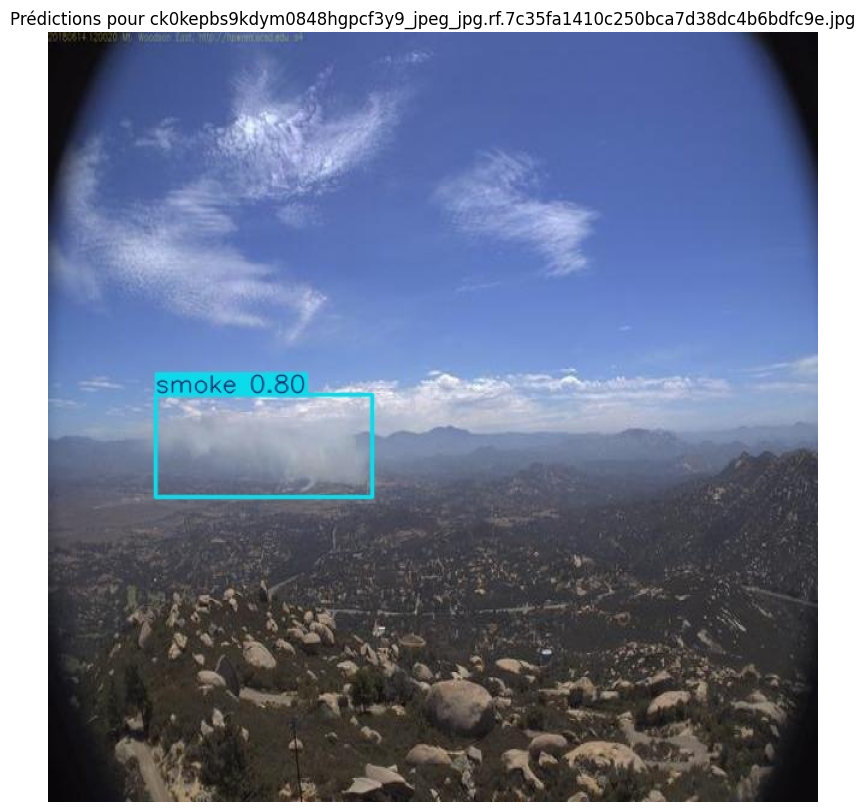

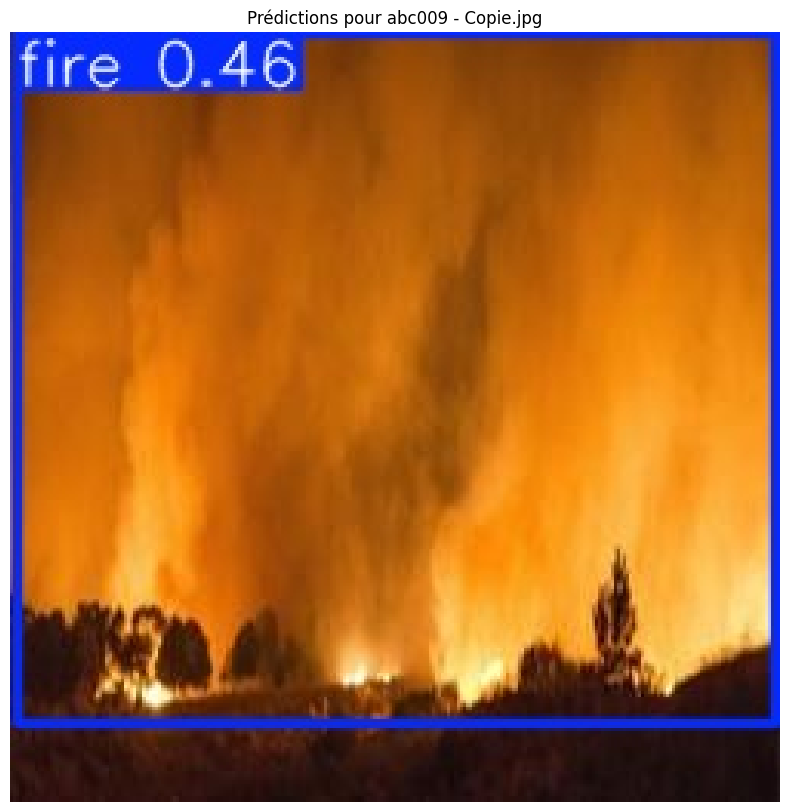

In [36]:
# Chemin vers le dossier où les images avec détections sont sauvegardées

predictions_dir = 'runs/detect/predict'

# Liste des images prédictes
predicted_images = os.listdir(predictions_dir)
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

# Lister uniquement les fichiers d'images et exclure les dossiers
predicted_images = [f for f in os.listdir(predictions_dir)
                    if os.path.isfile(os.path.join(predictions_dir, f)) and f.lower().endswith(image_extensions)]

print(predicted_images)
for img_name in predicted_images:
    img_path = os.path.join(predictions_dir, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Prédictions pour {img_name}')
    plt.show()


### Test sur le dataset de test

In [37]:

# Obtenir les métriques de test
metrics = model.val(data=data_file_path)  # Remplacer par le chemin correct de vos données



Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)


val: Scanning /content/Fire_smoke_detectionyv8_plus/valid/labels.cache... 1601 images, 67 backgrounds, 0 corrupt: 100%|██████████| 1601/1601 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 12, len(boxes) = 2706. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 101/101 [00:11<00:00,  8.51it/s]


                   all       1601       2706      0.817      0.685      0.754      0.517
                  fire        904       1545      0.832      0.755      0.816      0.582
                 smoke        941       1161      0.801      0.616      0.693      0.451
Speed: 0.2ms preprocess, 3.4ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to runs/detect/val


In [38]:
# Affichage des métriques
print(metrics.box.map)
print(metrics.box.map50)
print(metrics.box.map75)
print(metrics.box.maps)


0.5166268618412585
0.75443330044388
0.5191147137194682
[    0.58178     0.45147]


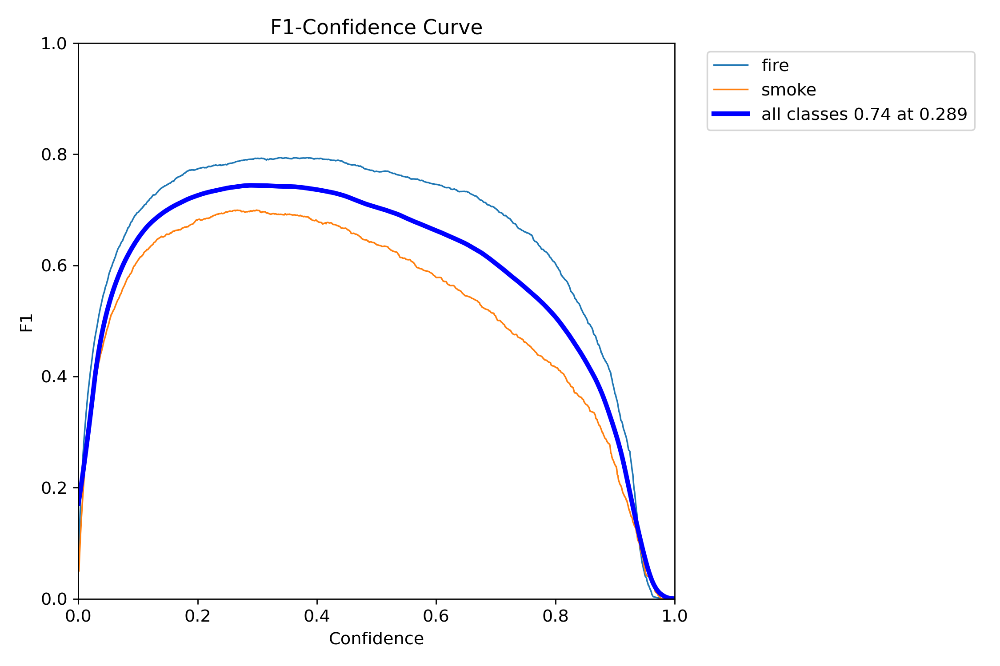

In [39]:
from IPython.display import Image

# Afficher le graphique des résultats
Image(filename='/content/runs/detect/val/F1_curve.png', width=800)


Max à 0.77 pour 0.3 de confiance

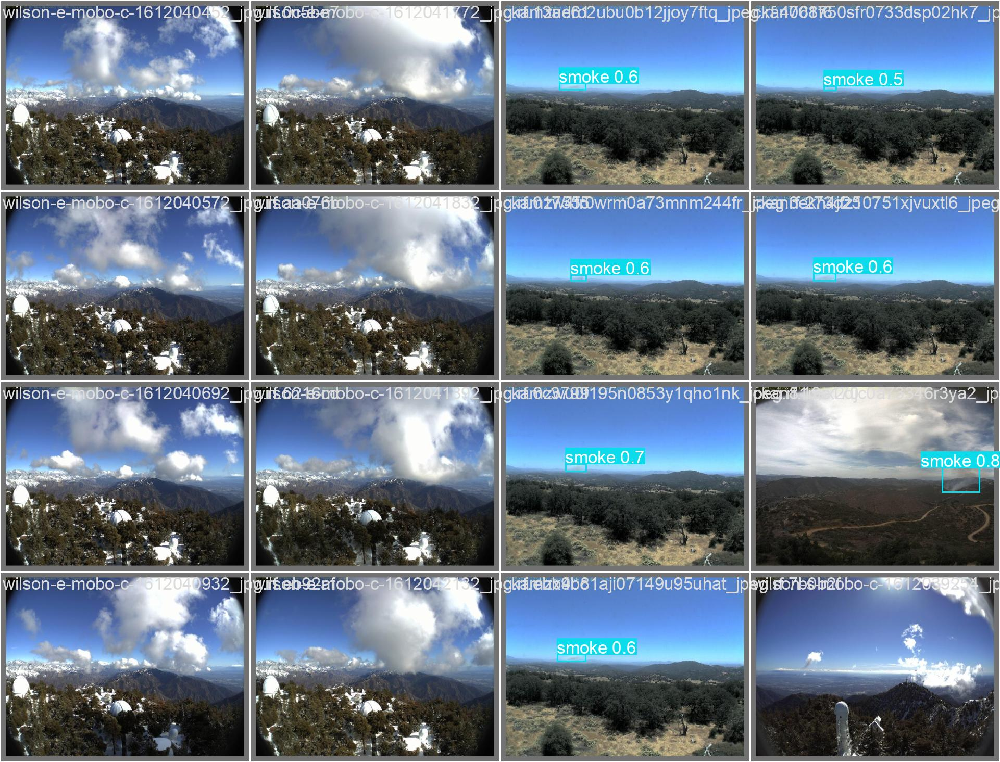

In [40]:
Image(filename='/content/runs/detect/val/val_batch0_pred.jpg', width=800)


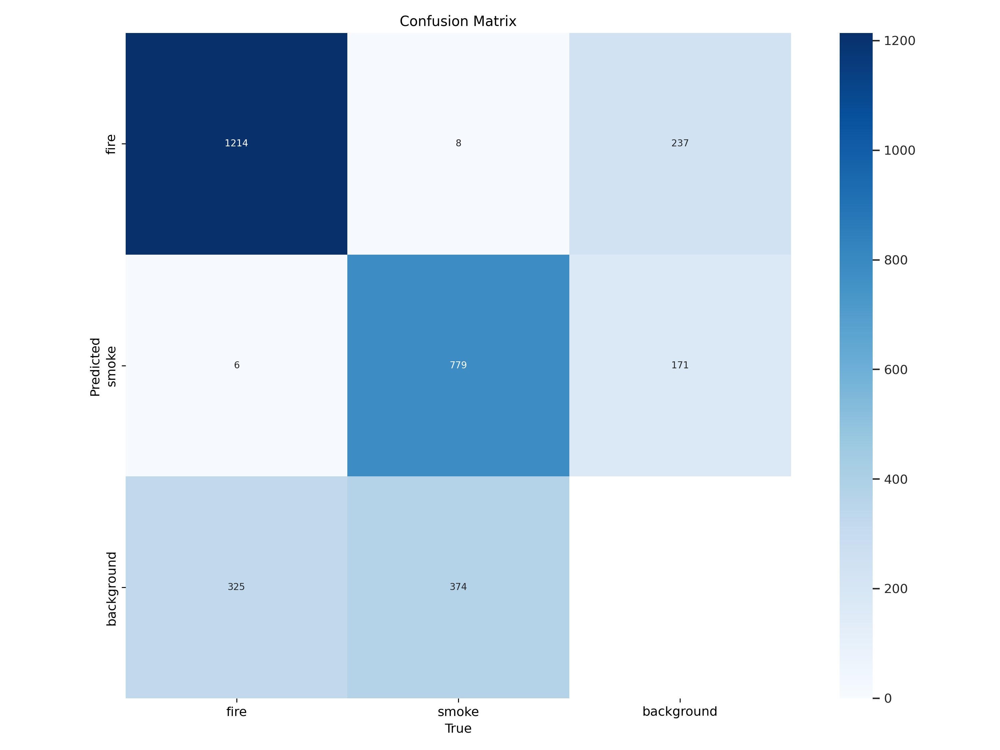

In [41]:
Image(filename='/content/runs/detect/val/confusion_matrix.png', width=800)


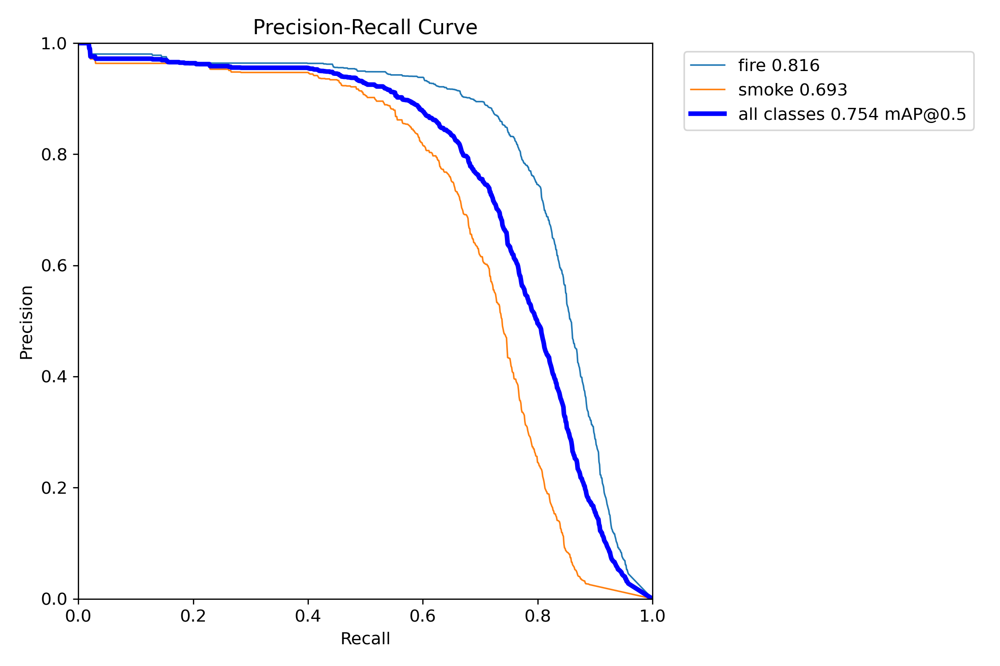

In [42]:
Image(filename='/content/runs/detect/val/PR_curve.png', width=800)


Mean Avergae Precision pour IOU=0.5 à 0.779

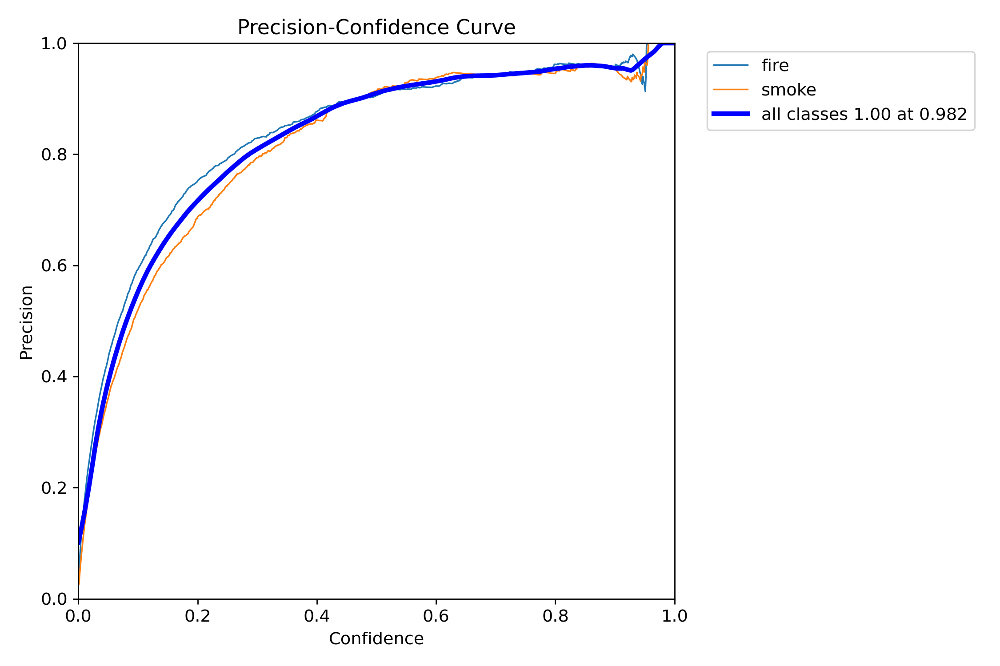

In [43]:
Image(filename='/content/runs/detect/val/P_curve.png', width=800)


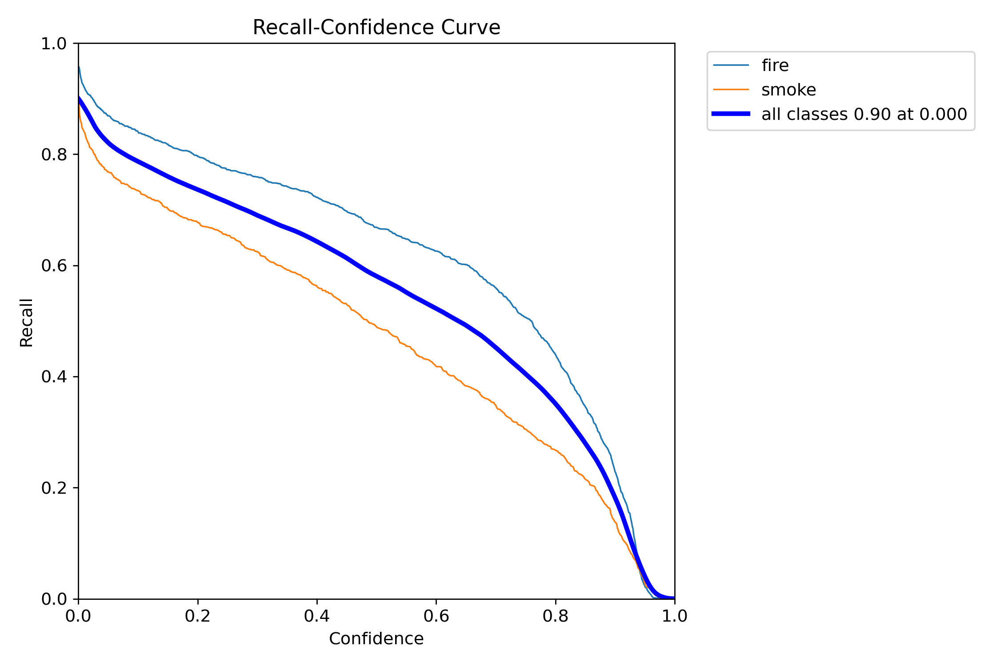

In [44]:
Image(filename='/content/runs/detect/val/R_curve.png', width=800)


### Conversion en TensorFlow Lite

In [45]:
model.export(format='tflite')

Ultralytics YOLOv8.2.101 🚀 Python-3.10.12 torch-2.4.1+cu121 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from '/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 6, 8400) (6.0 MB)
requirements: Ultralytics requirements ['sng4onnx>=1.0.1', 'onnx_graphsurgeon>=0.3.26', 'onnx>=1.12.0', 'onnx2tf>1.17.5,<=1.22.3', 'onnxslim>=0.1.31', 'tflite_support', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 136.6/136.6 kB 69.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.4/56.4 kB 297.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 182.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 435.0/435.0 kB 33.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.3/140.3 kB 282.9 MB/s eta 0:00:

100%|██████████| 1.11M/1.11M [00:00<00:00, 131MB/s]
Unzipping calibration_image_sample_data_20x128x128x3_float32.npy.zip to /content/calibration_image_sample_data_20x128x128x3_float32.npy...: 100%|██████████| 1/1 [00:00<00:00, 51.92file/s]


ONNX: starting export with onnx 1.16.2 opset 19...


ONNX: slimming with onnxslim 0.1.34...
ONNX: export success ✅ 3.1s, saved as '/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best.onnx' (11.8 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...
TensorFlow SavedModel: export success ✅ 41.2s, saved as '/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model' (29.5 MB)

TensorFlow Lite: starting export with tensorflow 2.17.0...
TensorFlow Lite: export success ✅ 0.0s, saved as '/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model/best_float32.tflite' (11.7 MB)

Export complete (42.7s)
Results saved to /content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights
Predict:         yolo predict task=detect model=/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights

'/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model/best_float32.tflite'

In [46]:
model_tf = YOLO("/content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model/best_float32.tflite")

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.


Loading /content/drive/MyDrive/results_fire/yolov8n_50_8_640_2024-09-18/yolov8n_50_8_640_2024-09-18/weights/best_saved_model/best_float32.tflite for TensorFlow Lite inference...

image 1/10 /content/test_images/abc006.jpg: 640x640 2 fires, 154.4ms
image 2/10 /content/test_images/abc009 - Copie.jpg: 640x640 1 fire, 148.0ms
image 3/10 /content/test_images/abc023.jpg: 640x640 1 smoke, 132.7ms
image 4/10 /content/test_images/abc175.jpg: 640x640 4 fires, 160.8ms
image 5/10 /content/test_images/abc191.jpg: 640x640 1 fire, 142.1ms
image 6/10 /content/test_images/abc199.jpg: 640x640 (no detections), 143.7ms
image 7/10 /content/test_images/abc203.jpg: 640x640 (no detections), 148.5ms
image 8/10 /content/test_images/ck0k99e6p79go0944lmxivkmv_jpeg_jpg.rf.33ca99d495144b9e7ffad0a4a453d3b7.jpg: 640x640 1 smoke, 154.9ms
image 9/10 /content/test_images/ck0kepbs9kdym0848hgpcf3y9_jpeg_jpg.rf.7c35fa1410c250bca7d38dc4b6bdfc9e.jpg: 640x640 1 smoke, 156.7ms
image 10/10 /content/test_images/ck0kmfd7ibcib0721

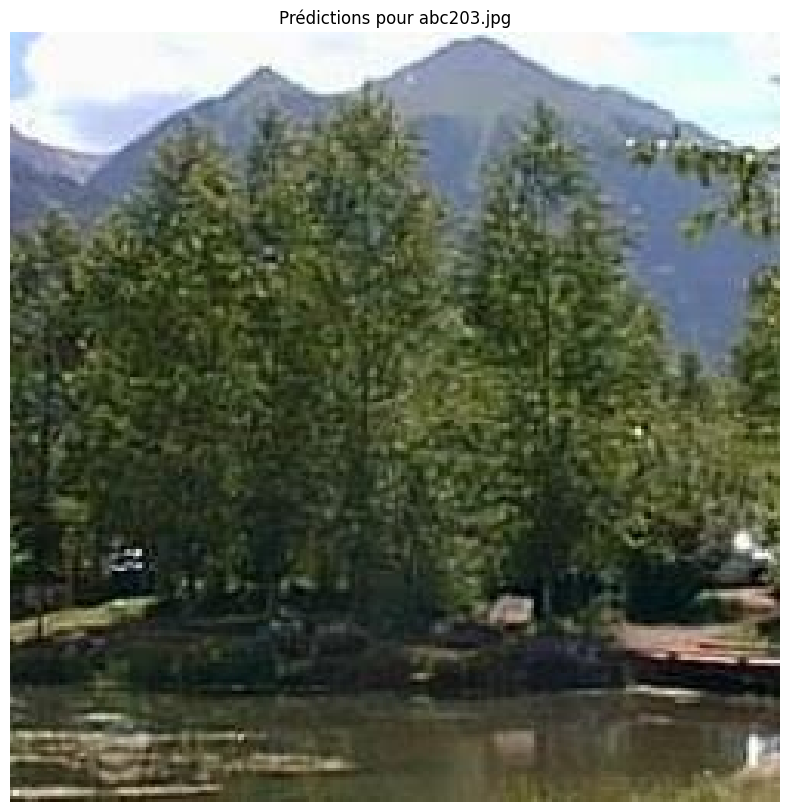

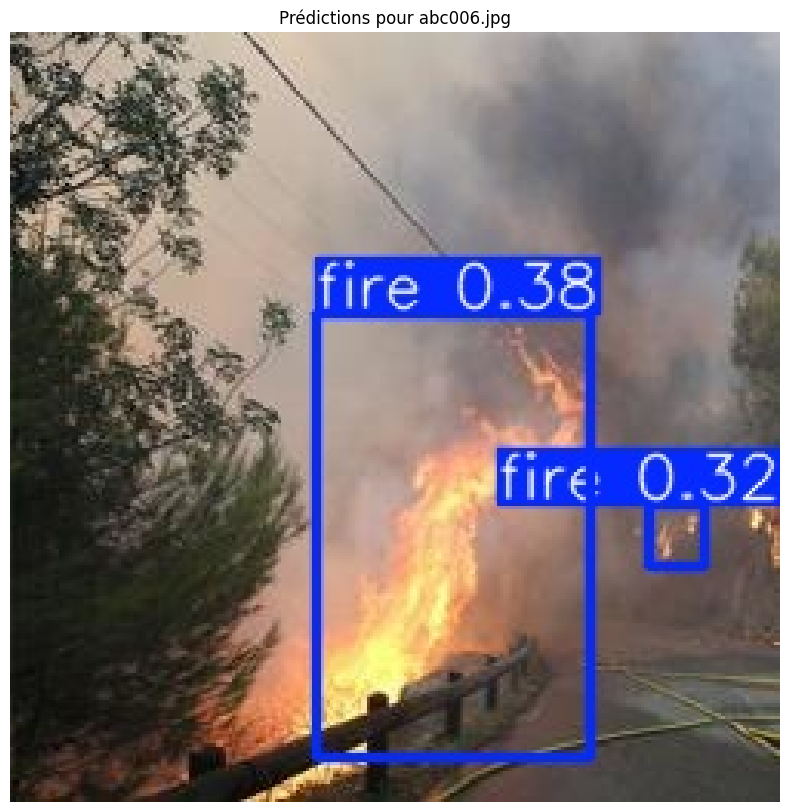

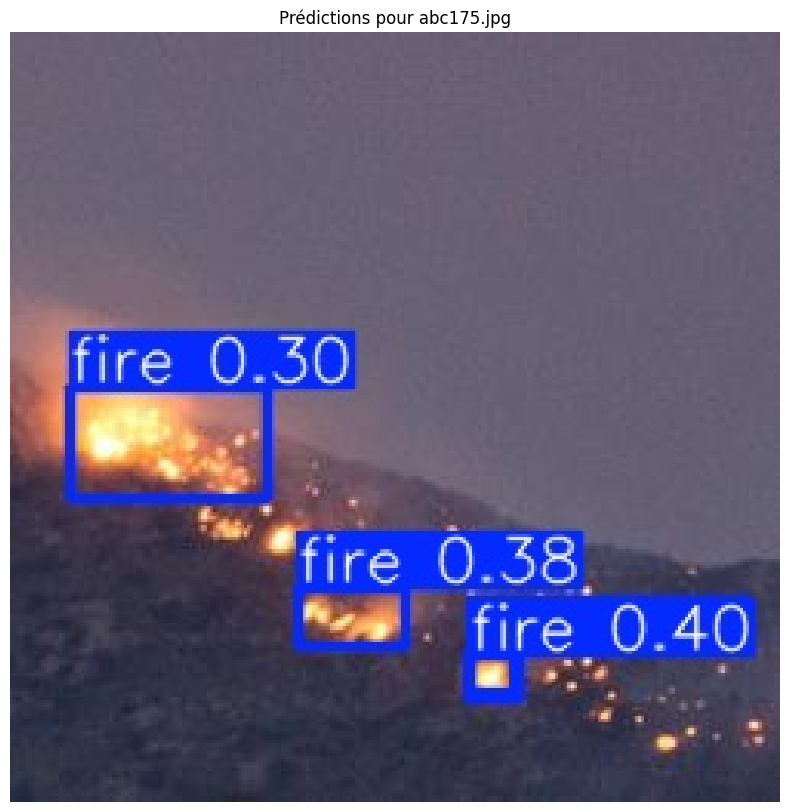

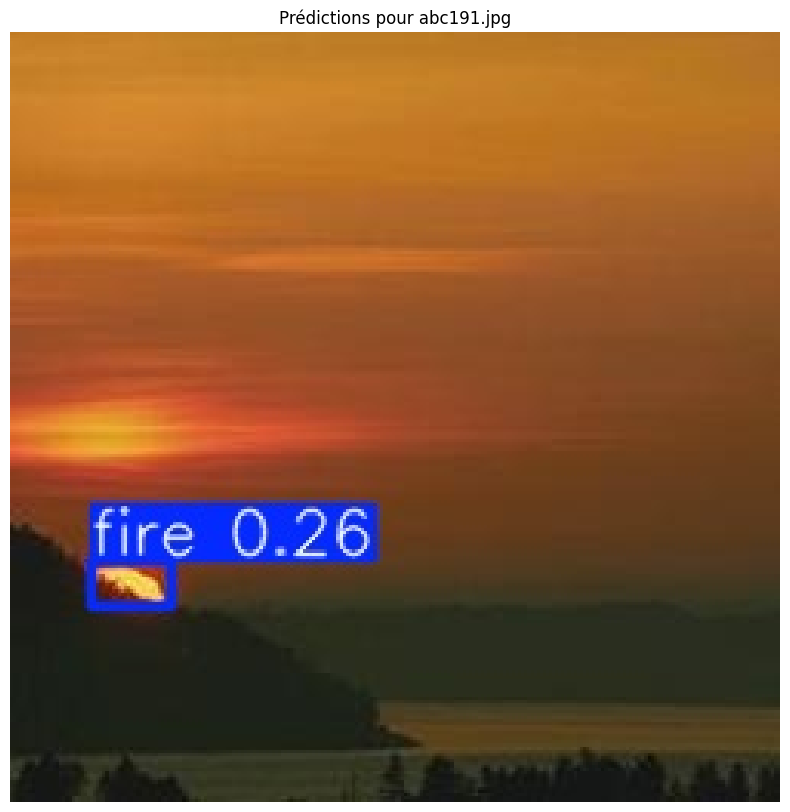

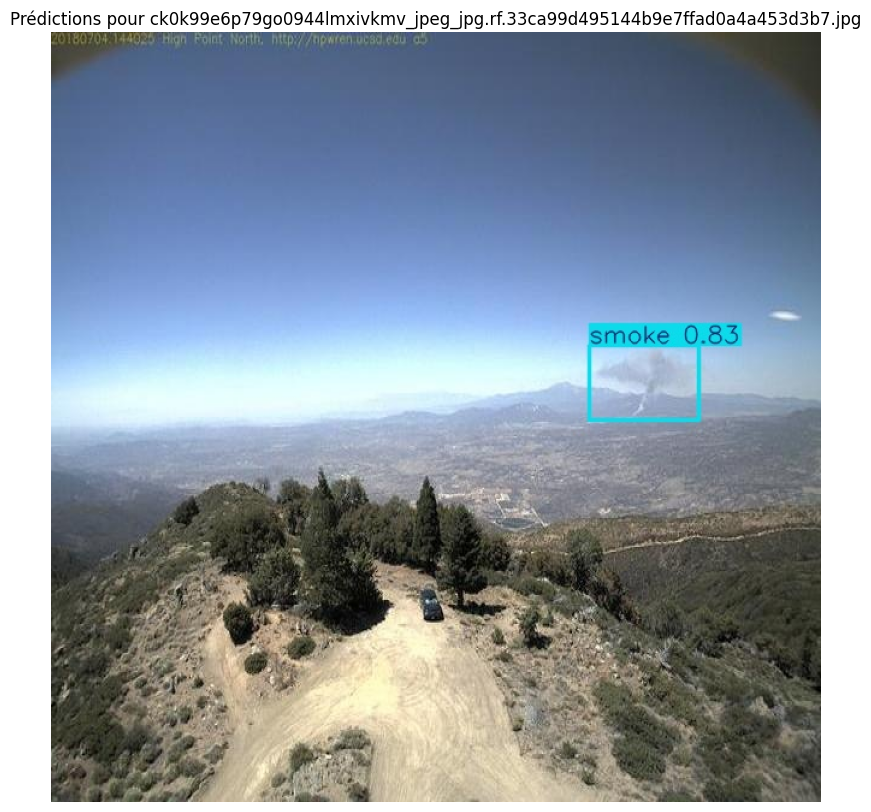

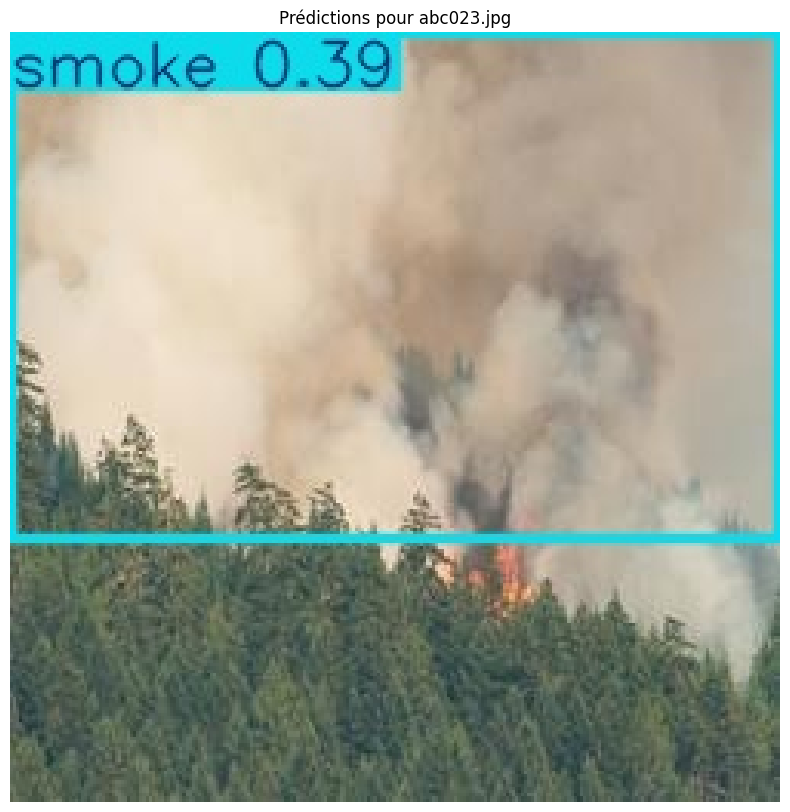

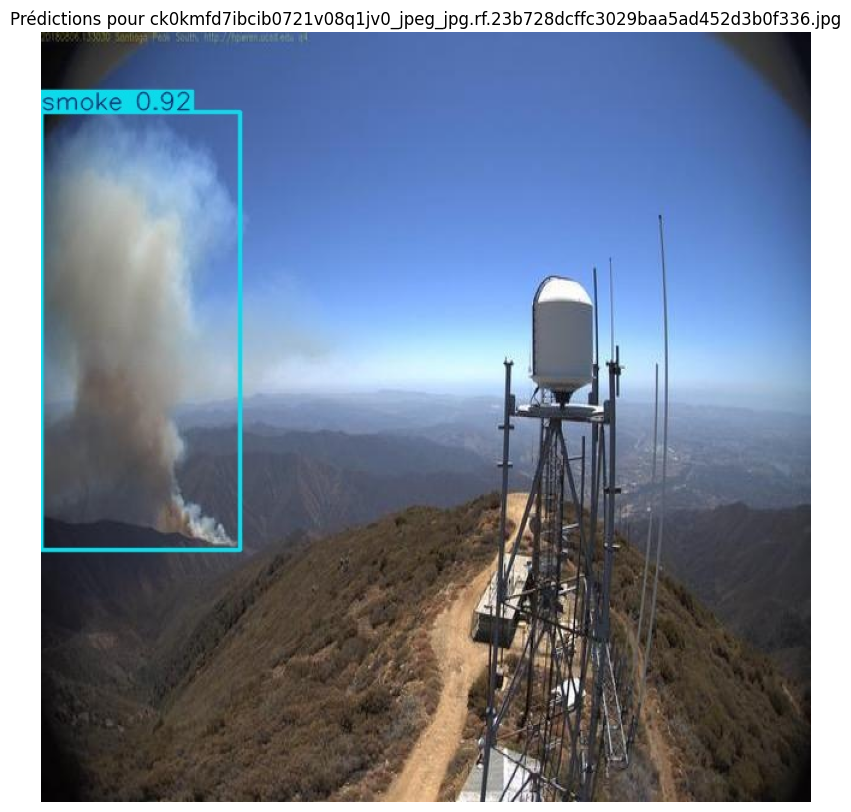

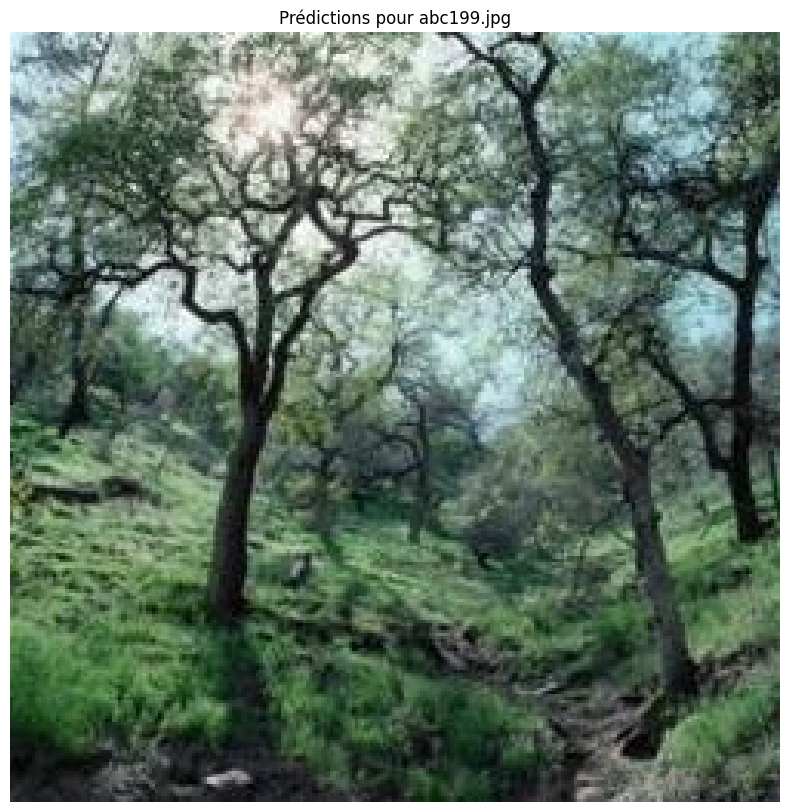

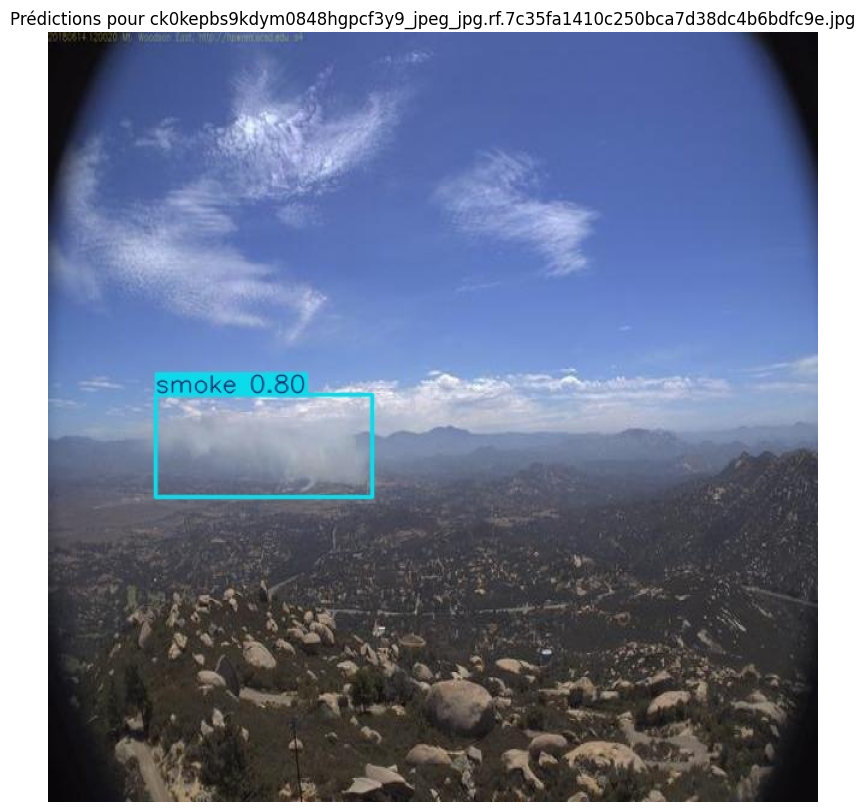

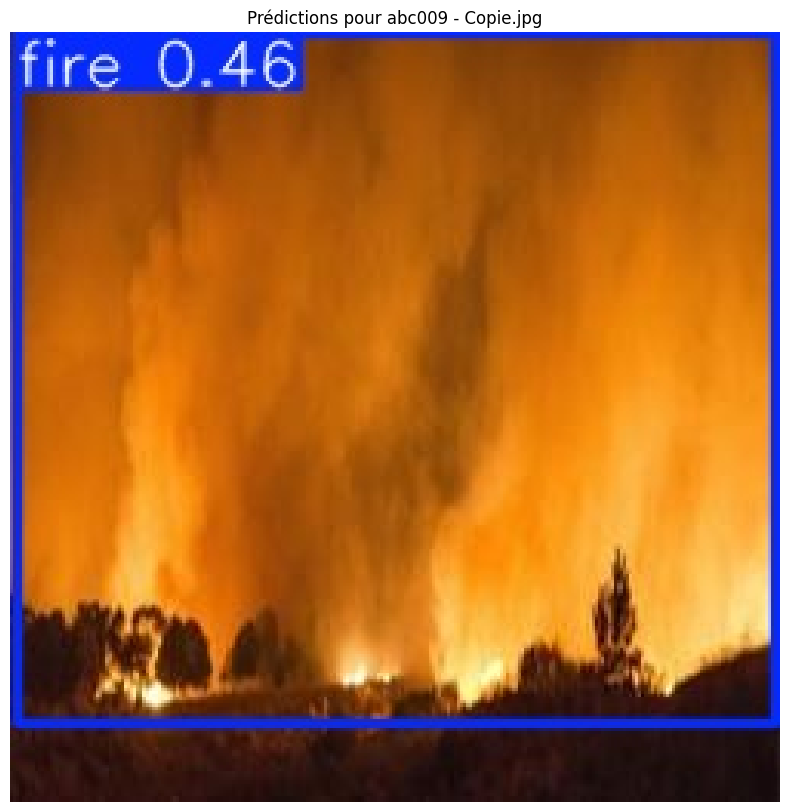

In [47]:
# Chemin vers le dossier où les images avec détections sont sauvegardées
results = model_tf.predict(source=test_images_path, save=True, save_txt=True)

predictions_dir = 'runs/detect/predict'

# Liste des images prédictes
predicted_images = os.listdir(predictions_dir)
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')

# Lister uniquement les fichiers d'images et exclure les dossiers
predicted_images = [f for f in os.listdir(predictions_dir)
                    if os.path.isfile(os.path.join(predictions_dir, f)) and f.lower().endswith(image_extensions)]

print(predicted_images)
for img_name in predicted_images:
    img_path = os.path.join(predictions_dir, img_name)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Prédictions pour {img_name}')
    plt.show()
